<a href="https://colab.research.google.com/github/rnwatanabe/BasketTracking/blob/master/bball_train.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities (e.g. compiled operators).
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
!pip install ndjson

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 4.1 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
Cloning into 'detectron2'...
remote: Enumerating objects: 15773, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (26/26), done.
remote: Total 15773 (delta 6), reused 26 (delta 4), pack-reused 15743 (from 1)
Receiving objects: 100% (15773/15773), 6.35 MiB | 3.52 MiB/s, done.
Resolving deltas: 100% (11502/11502), done.
Ignoring dataclasses: markers 'python_version < "3.7"' don't match your envi

In [3]:
from detectron2.structures import BoxMode
import pandas as pd
import os
import ndjson
import random
from detectron2.utils.visualizer import Visualizer
import cv2
import matplotlib.pyplot as plt
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.engine import DefaultTrainer
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.utils.visualizer import ColorMode
from google.colab.patches import cv2_imshow

In [4]:
!unzip bball_train.zip > /dev/null

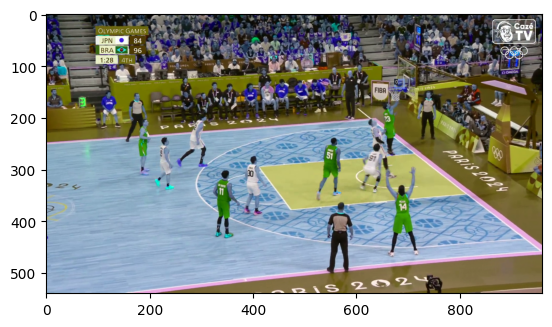

In [5]:
def get_bball_dicts(img_dir):
    json_file = os.path.join(img_dir, "annotation.ndjson")
    with open(json_file) as f:
        imgs_anns = ndjson.load(f)

    dataset_dicts = []
    for idx, v in enumerate(imgs_anns):
        record = {}

        row_data = v['data_row']['row_data']
        filename = row_data[row_data.find('vlc'):row_data.find('png')+3]
        filename = os.path.join(img_dir, filename)

        height = int(imgs_anns[0]['media_attributes']['height'])
        width = int(imgs_anns[0]['media_attributes']['width'])


        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = v['projects']['cm0cnnun900xs072dd9gy4c5m']['labels'][0]['annotations']['objects']

        objs = []
        for anno in annos:
            bound_box = anno['bounding_box']
            obj = {
                "bbox": [bound_box['left'], bound_box['top'], bound_box['left']+bound_box['width'], bound_box['top']+bound_box['height']],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": 0,
            }
            objs.append(obj)
        record["annotations"] = objs


        dataset_dicts.append(record)
    return dataset_dicts

# for d in ["train", "val"]:
#     DatasetCatalog.register("balloon_" + d, lambda d=d: get_balloon_dicts("balloon/" + d))
#     MetadataCatalog.get("balloon_" + d).set(thing_classes=["balloon"])
bball_dict = get_bball_dicts('./')
for d in random.sample(bball_dict, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    plt.imshow(out.get_image()[:, :, ::-1])

In [6]:
DatasetCatalog.register("bball_train", lambda d=d: get_bball_dicts('./'))
MetadataCatalog.get("bball_train").set(thing_classes=["bola de basquete"])
bball_metadata = MetadataCatalog.get("bball_train")
bball_metadata

namespace(name='bball_train', thing_classes=['bola de basquete'])

In [21]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("bball_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.0005  # pick a good LR
cfg.SOLVER.MAX_ITER = 1000    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.
cfg.OUTPUT_DIR = './output'

In [22]:

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/30 17:05:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/30 17:05:01 d2.engine.train_loop]: Starting training from iteration 0


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


[08/30 17:05:14 d2.utils.events]:  eta: 0:09:42  iter: 19  total_loss: 0.9322  loss_cls: 0.7322  loss_box_reg: 0.02087  loss_rpn_cls: 0.187  loss_rpn_loc: 0.006493    time: 0.5871  last_time: 0.6039  data_time: 0.0598  last_data_time: 0.0160   lr: 9.9905e-06  max_mem: 3032M
[08/30 17:05:26 d2.utils.events]:  eta: 0:09:44  iter: 39  total_loss: 0.7551  loss_cls: 0.5956  loss_box_reg: 0.01484  loss_rpn_cls: 0.1591  loss_rpn_loc: 0.008896    time: 0.6097  last_time: 0.6101  data_time: 0.0157  last_data_time: 0.0143   lr: 1.998e-05  max_mem: 3032M
[08/30 17:05:38 d2.utils.events]:  eta: 0:09:31  iter: 59  total_loss: 0.5771  loss_cls: 0.404  loss_box_reg: 0.01543  loss_rpn_cls: 0.1377  loss_rpn_loc: 0.01016    time: 0.6054  last_time: 0.5146  data_time: 0.0139  last_data_time: 0.0066   lr: 2.997e-05  max_mem: 3033M
[08/30 17:05:50 d2.utils.events]:  eta: 0:09:14  iter: 79  total_loss: 0.3893  loss_cls: 0.2547  loss_box_reg: 0.03122  loss_rpn_cls: 0.09472  loss_rpn_loc: 0.007456    time: 0.

In [23]:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2859), started 0:30:59 ago. (Use '!kill 2859' to kill it.)

<IPython.core.display.Javascript object>

In [24]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[08/30 17:16:57 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

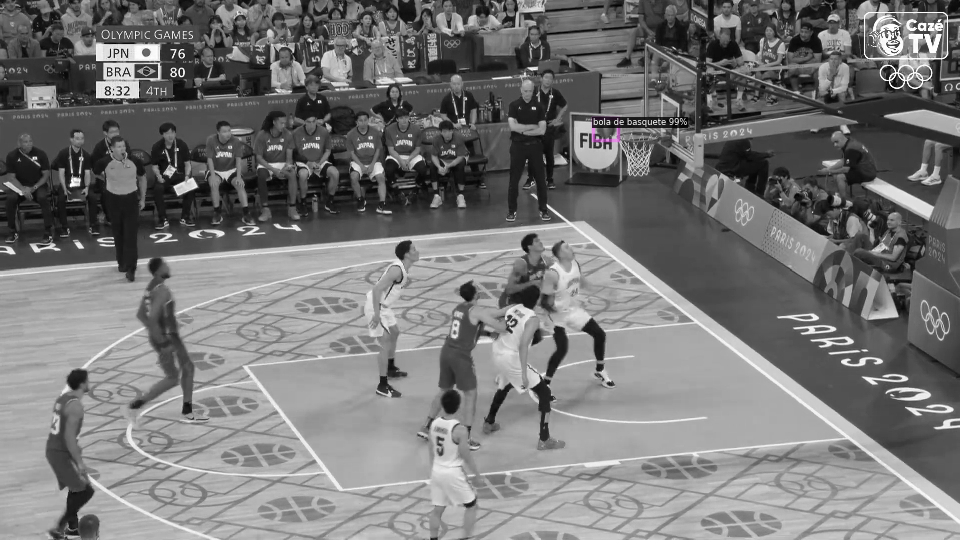

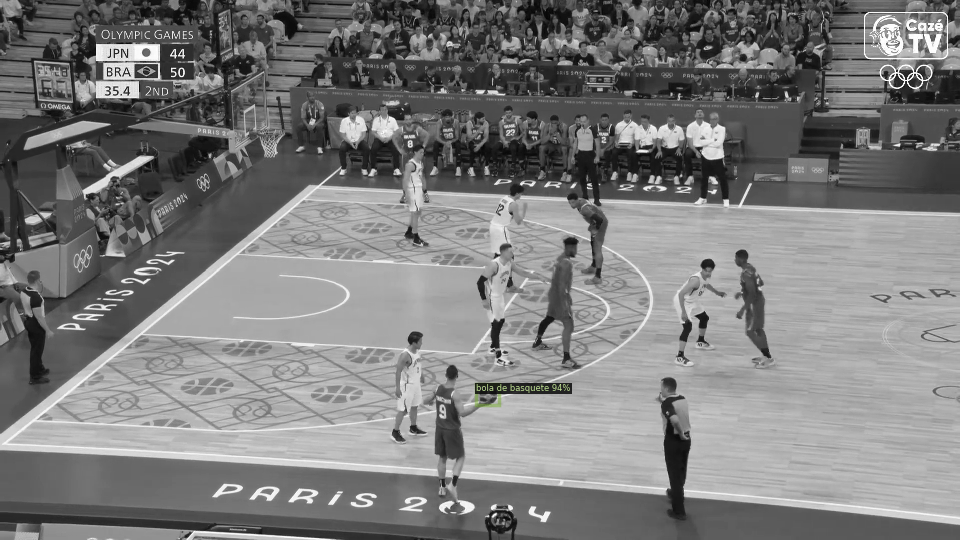

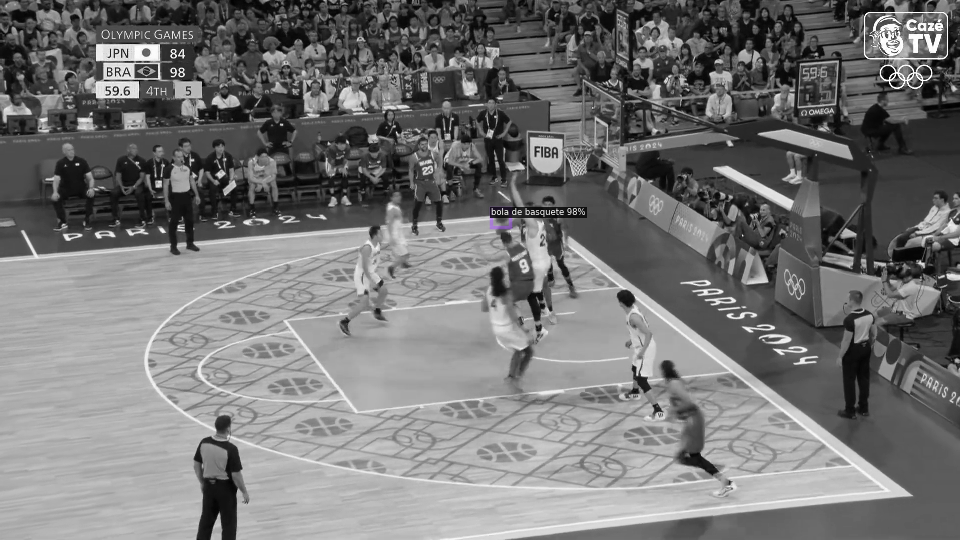

In [25]:
dataset_dicts = get_bball_dicts("./")
for d in random.sample(dataset_dicts, 3):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=bball_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [26]:
outputs

{'instances': Instances(num_instances=1, image_height=1080, image_width=1920, fields=[pred_boxes: Boxes(tensor([[ 982.6480,  415.5399, 1019.0306,  453.4945]], device='cuda:0')), scores: tensor([0.9752], device='cuda:0'), pred_classes: tensor([0], device='cuda:0')])}